# Necessary Imports

In [ ]:
!pip install --upgrade torchmetrics
!pip install nltk
!pip install git+https://github.com/salaniz/pycocoevalcap
!pip install -U bitsandbytes
!pip install --upgrade transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.5/963.5 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 118.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 98.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 73.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninst

In [ ]:
# Standard Libraries
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Image Processing
from skimage import io
from PIL import Image, ImageFile

# PyTorch
import torch
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image
from torch.optim import AdamW

# Transformers
from transformers import Blip2ForConditionalGeneration, AutoProcessor, BitsAndBytesConfig

# Evaluation Metrics
from torchmetrics.text.rouge import ROUGEScore
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.meteor_score import meteor_score

# Progress bar
from tqdm import tqdm

# NLTK (Meteor)
import nltk
nltk.download('punkt')

nltk.download('wordnet')
nltk.download('omw-1.4')

# Faster Dataset Processing
from concurrent.futures import ThreadPoolExecutor

# PEFT: LoRA
from peft import LoraConfig, get_peft_model

# Metrics
from pycocoevalcap.bleu.bleu import Bleu
from pycocoevalcap.cider.cider import Cider
from pycocoevalcap.rouge.rouge import Rouge
from pycocoevalcap.meteor.meteor import Meteor
from transformers import AutoTokenizer

# Inference
from google.colab import files

# Adaptive
import psutil




[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


# Dataset

## Google Drive

### Downloading Dataset

In [ ]:
# Install gdown (if needed)
!pip install gdown

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define Google Drive path for saving files
drive_path = '/content/drive/MyDrive/ROCOv2_images/'

# Create a folder in Google Drive for storing images
import os
os.makedirs(drive_path, exist_ok=True)

# Download ZIP files from Zenodo to Google Drive
!wget -O {drive_path}train_images.zip https://zenodo.org/records/10821435/files/train_images.zip?download=1
!wget -O {drive_path}test_images.zip https://zenodo.org/records/10821435/files/test_images.zip?download=1

# Unzip the downloaded files in Google Drive
!unzip -q {drive_path}train_images.zip -d {drive_path}
!unzip -q {drive_path}test_images.zip -d {drive_path}


Mounted at /content/drive
--2025-07-05 04:14:25--  https://zenodo.org/records/10821435/files/train_images.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.185.48.194, 188.185.43.25, 188.185.45.92, ...
Connecting to zenodo.org (zenodo.org)|188.185.48.194|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4611440786 (4.3G) [application/octet-stream]
Saving to: ‘/content/drive/MyDrive/ROCOv2_images/train_images.zip’

/content/drive/MyDr 100%[===================>]   4.29G  19.9MB/s    in 4m 1s   

2025-07-05 04:18:27 (18.3 MB/s) - ‘/content/drive/MyDrive/ROCOv2_images/train_images.zip’ saved [4611440786/4611440786]

--2025-07-05 04:18:27--  https://zenodo.org/records/10821435/files/test_images.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.185.43.25, 188.185.45.92, 188.185.48.194, ...
Connecting to zenodo.org (zenodo.org)|188.185.43.25|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 857754777 (818M) [application/octet-stream]

### Cheking Correct Extracting

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define Google Drive path for saving files
drive_path = '/content/drive/MyDrive/ROCOv2_images/'

# Create a folder in Google Drive for storing images if it doesn't exist
import os
os.makedirs(drive_path, exist_ok=True)

# Define subdirectories for images
train_dir = os.path.join(drive_path, 'train')
test_dir = os.path.join(drive_path, 'test')

# Create directories for images if they don't exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Check if the files already exist to avoid re-downloading them
train_zip = os.path.join(drive_path, 'train_images.zip')
test_zip = os.path.join(drive_path, 'test_images.zip')

# If the train_images.zip does not exist, download it
if not os.path.exists(train_zip):
    print("Downloading train_images.zip...")
    !wget -O {train_zip} https://zenodo.org/records/10821435/files/train_images.zip?download=1
else:
    print("train_images.zip already exists, skipping download.")

# If the test_images.zip does not exist, download it
if not os.path.exists(test_zip):
    print("Downloading test_images.zip...")
    !wget -O {test_zip} https://zenodo.org/records/10821435/files/test_images.zip?download=1
else:
    print("test_images.zip already exists, skipping download.")

# Unzip the downloaded files in the correct folders if not already extracted
if not os.path.exists(os.path.join(train_dir, 'train')):  # Checking if the images are already extracted
    print("Extracting train_images.zip...")
    !unzip -q {train_zip} -d {train_dir}
else:
    print("train_images.zip already extracted, skipping extraction.")

if not os.path.exists(os.path.join(test_dir, 'test')):  # Checking if the images are already extracted
    print("Extracting test_images.zip...")
    !unzip -q {test_zip} -d {test_dir}
else:
    print("test_images.zip already extracted, skipping extraction.")


Mounted at /content/drive
train_images.zip already exists, skipping download.
test_images.zip already exists, skipping download.
Extracting train_images.zip...
Extracting test_images.zip...


In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')

# Check if the directories exist
train_dir = '/content/drive/MyDrive/ROCOv2_images/train/'
test_dir = '/content/drive/MyDrive/ROCOv2_images/test/'

print(f"Train directory exists: {os.path.exists(train_dir)}")
print(f"Test directory exists: {os.path.exists(test_dir)}")


Mounted at /content/drive
Train directory exists: True
Test directory exists: True


### Let's Meet the Dataset


In [ ]:
import os
from PIL import Image
import pandas as pd
import numpy as np
from concurrent.futures import ThreadPoolExecutor

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Function to check image size and dimensions
def check_image_size(image_path):
    img = Image.open(image_path)
    return img.size  # Return (width, height)

# Function to check image mode (RGB or L)
def check_image_mode(image_path):
    img = Image.open(image_path)
    return img.mode  # Return image mode (RGB, L, etc.)

# Function to count number of images in directory
def count_images_in_directory(image_dir):
    return len([filename for filename in os.listdir(image_dir) if filename.endswith('.jpg')])

# Function to check captions and match with images
def check_captions_and_images(captions_file, image_dir):
    captions_df = pd.read_csv(captions_file)
    num_captions = len(captions_df)
    num_images = count_images_in_directory(image_dir)
    print(f"Number of captions in {captions_file}: {num_captions}")
    print(f"Number of images in {image_dir}: {num_images}")
    return num_captions, num_images

# Function to check if ZIP file is extracted correctly
def check_extracted_images(image_dir, subdir_name):
    subdir_path = os.path.join(image_dir, subdir_name)
    if not os.path.exists(subdir_path):
        print(f"Warning: {subdir_name} directory not found.")
    else:
        print(f"{subdir_name} directory exists and contains {len(os.listdir(subdir_path))} images.")

# Paths to train/test images and captions in Google Drive
train_images_dir = '/content/drive/MyDrive/ROCOv2_images/train/'
test_images_dir = '/content/drive/MyDrive/ROCOv2_images/test/'

train_captions_file = '/content/drive/MyDrive/ROCOv2_images/train_captions.csv'
test_captions_file = '/content/drive/MyDrive/ROCOv2_images/test_captions.csv'

# Parallel processing with ThreadPoolExecutor
def process_images_parallel(image_dir, function, max_workers=4):
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        image_paths = [os.path.join(image_dir, filename) for filename in os.listdir(image_dir) if filename.endswith('.jpg')]
        results = list(executor.map(function, image_paths))  # Apply function to each image in parallel
    return results

# Check image size (width, height) in parallel
train_sizes = process_images_parallel(train_images_dir, check_image_size)
test_sizes = process_images_parallel(test_images_dir, check_image_size)

# Check image mode (RGB or L) in parallel
train_modes = process_images_parallel(train_images_dir, check_image_mode)
test_modes = process_images_parallel(test_images_dir, check_image_mode)

# Check number of images and captions
train_captions_count, train_images_count = check_captions_and_images(train_captions_file, train_images_dir)
test_captions_count, test_images_count = check_captions_and_images(test_captions_file, test_images_dir)

# Ensure images are extracted correctly
check_extracted_images('/content/drive/MyDrive/ROCOv2_images', 'train')
check_extracted_images('/content/drive/MyDrive/ROCOv2_images', 'test')

# Output results
print(f"\nTrain Image Sizes (Width x Height): {train_sizes[:5]}")  # Print first 5 sizes
print(f"Test Image Sizes (Width x Height): {test_sizes[:5]}")  # Print first 5 sizes
print(f"\nTrain Image Modes: {set(train_modes)}")  # Print unique image modes
print(f"Test Image Modes: {set(test_modes)}")  # Print unique image modes
print(f"\nTrain Captions vs Images: {train_captions_count} captions vs {train_images_count} images")
print(f"Test Captions vs Images: {test_captions_count} captions vs {test_images_count} images")


MessageError: Error: credential propagation was unsuccessful

In [ ]:
import os
from skimage import io
from torch.utils.data import Dataset
import pandas as pd
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

class ROCOV2Dataset(Dataset):
    def __init__(
        self,
        root_dir: str,
        train: bool = False,
        test: bool = False,
        transform=None
    ):
        self.root_dir = root_dir  # Root directory where images are stored
        self.transform = transform  # Transform for image preprocessing
        self.train = train  # Flag to use train data
        self.test = test  # Flag to use test data

        # Define directories for train and test images in Google Drive
        self.train_dir = os.path.join(root_dir, 'train')
        self.test_dir = os.path.join(root_dir, 'test')

        # Load captions from CSV files
        caption_files = {
            'train': '/content/drive/MyDrive/ROCOv2_images/train_captions.csv',
            'test': '/content/drive/MyDrive/ROCOv2_images/test_captions.csv'
        }

        self.captions = {}
        for caption in caption_files:
            df = pd.read_csv(caption_files[caption])  # Load CSV
            self.captions[caption] = df.set_index('ID').to_dict()['Caption']  # Map captions to image IDs

        # Set lengths for train and test data
        self.train_len = len(self.captions['train'])
        self.test_len = len(self.captions['test'])

    def __len__(self):
        length = 0
        if self.train:
            length += self.train_len
        if self.test:
            length += self.test_len
        return length

    def __getitem__(self, idx) -> dict:
        file_name = ''
        image_loc = ''
        caption = ''

        if self.train:
            file_name = list(self.captions['train'].keys())[idx]  # Get image ID for training
            caption = self.captions['train'][file_name]  # Get caption for training
            image_loc = os.path.join(self.train_dir, f'{file_name}.jpg')  # Image path in Google Drive
        elif self.test:
            file_name = list(self.captions['test'].keys())[idx]  # Get image ID for test
            caption = self.captions['test'][file_name]  # Get caption for test
            image_loc = os.path.join(self.test_dir, f'{file_name}.jpg')  # Image path in Google Drive

        img = io.imread(image_loc)  # Read the image

        if self.transform:
            img = self.transform(img)  # Apply any transformations

        return {'image': img, 'text': caption}  # Return image and caption

# Define the root directory in Google Drive where the images are stored
root_dir = "/content/drive/MyDrive/ROCOv2_images"

# Instantiate the dataset for training and testing
train_data = ROCOV2Dataset(root_dir, train=True)
test_data = ROCOV2Dataset(root_dir, test=True)


# # Define a transform to resize images to 256x256 pixels
# data_transform = transforms.Compose([
#     transforms.ToPILImage(),  # Convert numpy array to PIL image
#     transforms.Resize((224, 224)),  # Resize the image to 256x256 pixels
#     transforms.ToTensor(),  # Convert PIL image to tensor
    # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
# ])

root_dir = "/home/CinCin/code/dataset"
train_data = ROCODataset(root_dir, train=True)
valid_data = ROCODataset(root_dir, valid=True)
test_data = ROCODataset(root_dir, test=True)

## KAGGLE

### Uploading Dataset

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("claudiopisa9884/roco-v2")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/roco-v2


### Let's Meet the Dataset

In [ ]:
# Function to search for a specific folder in a directory
def find_folder_in_directory(root_dir, folder_name):
    for root, dirs, files in os.walk(root_dir):
        if folder_name in dirs:  # Check if folder exists in the current directory
            return os.path.join(root, folder_name)  # Return the full path of the folder
    return None  # Return None if the folder is not found

# Path to the main dataset directory (this path is always known)
dataset_path = path
# Dynamically search for the 'train_images' and 'test_images' directories
train_images_dir = find_folder_in_directory(dataset_path, 'train')
test_images_dir = find_folder_in_directory(dataset_path, 'test')

# Dynamically search for the caption files
train_captions_file = os.path.join(dataset_path, 'train_captions.csv')
test_captions_file = os.path.join(dataset_path, 'test_captions.csv')

# Check if the directories and files were found
print(f"Train images directory: {train_images_dir}")
print(f"Test images directory: {test_images_dir}")
print(f"Train captions file: {train_captions_file}")
print(f"Test captions file: {test_captions_file}")


Train images directory: /kaggle/input/roco-v2/rocov2/train_images/train
Test images directory: /kaggle/input/roco-v2/rocov2/test_images/test
Train captions file: /kaggle/input/roco-v2/train_captions.csv
Test captions file: /kaggle/input/roco-v2/test_captions.csv


In [ ]:
# Function to find directories or files dynamically based on the dataset path
def find_file_in_directory(dataset_path, file_name):
    for root, dirs, files in os.walk(dataset_path):
        if file_name in files:  # Check if file exists in the current directory
            return os.path.join(root, file_name)  # Return the full path of the file
    return None  # Return None if the file is not found

# Function to check image size and dimensions
def check_image_size(image_path):
    img = Image.open(image_path)
    return img.size  # Return (width, height)

# Function to check image mode (RGB or L)
def check_image_mode(image_path):
    img = Image.open(image_path)
    return img.mode  # Return image mode (RGB, L, etc.)

# Function to count number of images in directory, including multiple image extensions
def count_images_in_directory(image_dir):
    valid_extensions = ('.jpg', '.jpeg', '.png')  # Add other image extensions here if necessary
    return len([filename for filename in os.listdir(image_dir) if filename.lower().endswith(valid_extensions)])

# Function to check captions and match with images
def check_captions_and_images(captions_file, image_dir):
    captions_df = pd.read_csv(captions_file)
    num_captions = len(captions_df)
    num_images = count_images_in_directory(image_dir)
    print(f"Number of captions in {captions_file}: {num_captions}")
    print(f"Number of images in {image_dir}: {num_images}")
    return num_captions, num_images

# Parallel processing with ThreadPoolExecutor
def process_images_parallel(image_dir, function, max_workers=4):
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        image_paths = [os.path.join(image_dir, filename) for filename in os.listdir(image_dir) if filename.endswith('.jpg')]
        results = list(executor.map(function, image_paths))  # Apply function to each image in parallel
    return results

# Path to dataset files from Kaggle (find the path dynamically)
dataset_path = path

# Find the directories dynamically for train and test images
train_images_dir = find_folder_in_directory(dataset_path, 'train')
test_images_dir = find_folder_in_directory(dataset_path, 'test')

# Find the caption files dynamically
train_captions_file = find_file_in_directory(dataset_path, 'train_captions.csv')
test_captions_file = find_file_in_directory(dataset_path, 'test_captions.csv')

# Check if the directories and files are found
print(f"Train images directory: {train_images_dir}")
print(f"Test images directory: {test_images_dir}")
print(f"Train captions file: {train_captions_file}")
print(f"Test captions file: {test_captions_file}")

# Check image size (width, height) in parallel
train_sizes = process_images_parallel(train_images_dir, check_image_size)
test_sizes = process_images_parallel(test_images_dir, check_image_size)

# Check image mode (RGB or L) in parallel
train_modes = process_images_parallel(train_images_dir, check_image_mode)
test_modes = process_images_parallel(test_images_dir, check_image_mode)

# Check number of images and captions
train_captions_count, train_images_count = check_captions_and_images(train_captions_file, train_images_dir)
test_captions_count, test_images_count = check_captions_and_images(test_captions_file, test_images_dir)

# Output results
print(f"\nTrain Image Sizes (Width x Height): {train_sizes[:5]}")  # Print first 5 sizes
print(f"Test Image Sizes (Width x Height): {test_sizes[:5]}")  # Print first 5 sizes
print(f"\nTrain Image Modes: {set(train_modes)}")  # Print unique image modes
print(f"Test Image Modes: {set(test_modes)}")  # Print unique image modes
print(f"\nTrain Captions vs Images: {train_captions_count} captions vs {train_images_count} images")
print(f"Test Captions vs Images: {test_captions_count} captions vs {test_images_count} images")


Train images directory: /kaggle/input/roco-v2/rocov2/train_images/train
Test images directory: /kaggle/input/roco-v2/rocov2/test_images/test
Train captions file: /kaggle/input/roco-v2/rocov2/train_captions.csv
Test captions file: /kaggle/input/roco-v2/rocov2/test_captions.csv
Number of captions in /kaggle/input/roco-v2/rocov2/train_captions.csv: 59958
Number of images in /kaggle/input/roco-v2/rocov2/train_images/train: 59958
Number of captions in /kaggle/input/roco-v2/rocov2/test_captions.csv: 9927
Number of images in /kaggle/input/roco-v2/rocov2/test_images/test: 9927

Train Image Sizes (Width x Height): [(250, 388), (630, 384), (630, 434), (637, 938), (530, 602)]
Test Image Sizes (Width x Height): [(736, 591), (680, 475), (750, 750), (730, 691), (742, 907)]

Train Image Modes: {'RGB', 'L'}
Test Image Modes: {'RGB', 'L'}

Train Captions vs Images: 59958 captions vs 59958 images
Test Captions vs Images: 9927 captions vs 9927 images


## Create PyTorch Dataset

In [ ]:
# Function to find both files and folders dynamically based on the dataset path
def find_file_or_folder_in_directory(root_dir, name, is_file=True):
    """
    Function to find a file or folder dynamically in the directory
    :param root_dir: Root directory to search
    :param name: File or folder name to search
    :param is_file: If True, search for a file, otherwise for a folder
    :return: Full path of the file/folder if found, None otherwise
    """
    for root, dirs, files in os.walk(root_dir):
        if is_file:
            if name in files:
                return os.path.join(root, name)  # Return the full path of the file
        else:
            if name in dirs:
                return os.path.join(root, name)  # Return the full path of the folder
    return None  # Return None if file/folder is not found

def safe_read_csv(file_path):
    encodings = ['utf-8', 'utf-8-sig', 'unicode_escape', 'latin1', 'ISO-8859-1']
    for enc in encodings:
        try:
            return pd.read_csv(file_path, encoding=enc, engine='python')
        except Exception:
            continue
    print(f">< Failed to read CSV: {file_path}")
    return None

class ROCOV2Dataset(Dataset):
    def __init__(self, root_dir: str, train: bool = False, test: bool = False, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.train = train
        self.test = test

        self.train_dir = find_file_or_folder_in_directory(root_dir, 'train', is_file=False)
        self.test_dir = find_file_or_folder_in_directory(root_dir, 'test', is_file=False)

        caption_files = {
            'train': find_file_or_folder_in_directory(root_dir, 'train_captions.csv', is_file=True),
            'test': find_file_or_folder_in_directory(root_dir, 'test_captions.csv', is_file=True)
        }

        self.captions = {}
        for split in caption_files:
            path = caption_files[split]
            if path is None:
                print(f">< {split}_captions.csv not found.")
                continue
            df = safe_read_csv(path)
            if df is not None and 'ID' in df.columns and 'Caption' in df.columns:
                self.captions[split] = df.set_index('ID').to_dict()['Caption']
            else:
                print(f"! Skipping {split} captions due to invalid format.")

        self.train_len = len(self.captions.get('train', {}))
        self.test_len = len(self.captions.get('test', {}))

        print(f"Train images directory: {self.train_dir}")
        print(f"Test images directory: {self.test_dir}")
        print(f"Train captions file: {caption_files['train']}")
        print(f"Test captions file: {caption_files['test']}")

    def __len__(self):
        return self.train_len if self.train else self.test_len

    def __getitem__(self, idx) -> dict:
        captions = self.captions.get('train') if self.train else self.captions.get('test')
        image_dir = self.train_dir if self.train else self.test_dir

        if captions is None or image_dir is None:
            raise RuntimeError("Dataset not properly initialized. Check data paths.")

        file_name = list(captions.keys())[idx]
        caption = captions[file_name]
        image_path = os.path.join(image_dir, f'{file_name}.jpg')

        try:
            img = Image.open(image_path).convert("RGB")
            img = np.array(img)
        except Exception as e:
            print(f"Skipping corrupted image at index {idx}: {e}")
            return self.__getitem__((idx + 1) % len(self))

        if self.transform:
            img = self.transform(img)

        return {'image': img, 'text': caption}

# Define the root directory in Kaggle where the images are stored
root_dir = path

# Instantiate the dataset for training and testing
train_data = ROCOV2Dataset(root_dir, train=True)
test_data = ROCOV2Dataset(root_dir, test=True)

# Now we can return the paths for train and test directories, and captions files
train_dir_image = train_data.train_dir
test_dir_image = test_data.test_dir
train_caption_dir = train_data.captions['train']
test_caption_dir = test_data.captions['test']

print(f"Train Images Directory: {train_dir_image}")
print(f"Test Images Directory: {test_dir_image}")
print(f"Train Captions Directory: {train_caption_dir}")
print(f"Test Captions Directory: {test_caption_dir}")


Train images directory: /kaggle/input/roco-v2/rocov2/train_images/train
Test images directory: /kaggle/input/roco-v2/rocov2/test_images/test
Train captions file: /kaggle/input/roco-v2/rocov2/train_captions.csv
Test captions file: /kaggle/input/roco-v2/rocov2/test_captions.csv
Train images directory: /kaggle/input/roco-v2/rocov2/train_images/train
Test images directory: /kaggle/input/roco-v2/rocov2/test_images/test
Train captions file: /kaggle/input/roco-v2/rocov2/train_captions.csv
Test captions file: /kaggle/input/roco-v2/rocov2/test_captions.csv
Train Images Directory: /kaggle/input/roco-v2/rocov2/train_images/train
Test Images Directory: /kaggle/input/roco-v2/rocov2/test_images/test
Train Captions Directory: {'ROCOv2_2023_train_000001': 'Head CT demonstrating left parotiditis.', 'ROCOv2_2023_train_000002': 'Acquired renal cysts in end-stage renal failure: 16-year-old girl with Alport syndrome and peritoneal dialysis from the age of 2\xa0years', 'ROCOv2_2023_train_000003': 'Computed 

In [ ]:
# Enable loading truncated images
ImageFile.LOAD_TRUNCATED_IMAGES = True

class ImageCaptioningDataset(Dataset):
    def __init__(self, dataset, processor, image_size=224, max_retries=5):
        self.dataset = dataset
        self.processor = processor
        self.image_size = image_size
        self.max_retries = max_retries

        self.transform = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.Normalize(
                mean=[0.48145466, 0.4578275, 0.40821073],
                std=[0.26862954, 0.26130258, 0.27577711]
            )
        ])

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        retries = 0
        while retries < self.max_retries:
            try:
                item = self.dataset[idx]
                image = item.get("image", None)
                text = item.get("text", "")

                if image is None:
                    raise ValueError("Missing image in dataset item.")

                if isinstance(image, np.ndarray):
                    if image.max() > 1.0:
                        image = image.astype(np.uint8)
                    image = Image.fromarray(image)

                if image.mode != "RGB":
                    image = image.convert("RGB")

                # Remove Exif and XMP metadata
                image_clean = Image.new(image.mode, image.size)
                image_clean.putdata(list(image.getdata()))
                image = image_clean

                image = self.transform(image)

                # Handle text errors gracefully
                try:
                    if not isinstance(text, str):
                        text = str(text)
                except Exception:
                    text = ""

                inputs = self.processor(
                    text=text,
                    padding="max_length",
                    max_length=32,
                    truncation=True,
                    return_tensors="pt"
                )

                return {
                    "pixel_values": image,
                    "input_ids": inputs["input_ids"].squeeze(0),
                    "attention_mask": inputs["attention_mask"].squeeze(0),
                    "text": text
                }

            except Exception as e:
                retries += 1
                print(f"Skipping item at index {idx} due to: {e} (Attempt {retries}/{self.max_retries})")

        # If all retries failed, try next sample
        print(f"Giving up on index {idx}. Moving to next sample.")
        return self.__getitem__((idx + 1) % len(self))

# Collate function
def collate_fn(batch):
    pixel_values = torch.stack([example["pixel_values"] for example in batch])
    input_ids = torch.stack([example["input_ids"] for example in batch])
    attention_mask = torch.stack([example["attention_mask"] for example in batch])
    texts = [example["text"] for example in batch]

    return {
        "pixel_values": pixel_values,
        "input_ids": input_ids,
        "attention_mask": attention_mask,
        "text": texts
    }

## BLIP2 OPT 2.7b

In [ ]:
# Configuring 8-bit quantization for the model
quantization_config = BitsAndBytesConfig(load_in_8bit=True,
                                         llm_int8_threshold=200.0)

# Loading the processor from Hugging Face
processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")

# Loading the BLIP2 model from Hugging Face with 8-bit quantization configuration
model = Blip2ForConditionalGeneration.from_pretrained(
    "Salesforce/blip2-opt-2.7b",  # Loading the model from Hugging Face
    device_map="auto",  # The model will automatically be placed on CPU or GPU
    torch_dtype=torch.float16, # For A100
    quantization_config=quantization_config  # Applying the quantization configuration
)

# Print message to indicate that the model has been successfully loaded
print(":) Model loaded successfully from Hugging Face!")


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


processor_config.json:   0%|          | 0.00/68.0 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/882 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

added_tokens.json:   0%|          | 0.00/23.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/10.0G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

:) Model loaded successfully from Hugging Face!


## LoRA

In [ ]:
config = LoraConfig(
    r=4,
    lora_alpha=16,
    lora_dropout=0.05,
    bias="none",
    target_modules=["q_proj", "k_proj"])  #v_proj

model = get_peft_model(model, config)
model.print_trainable_parameters()

trainable params: 1,310,720 || all params: 3,746,072,576 || trainable%: 0.0350


## Fine-Tuning Multi Modal Model

### Train and Test Dataset - Adaptive

In [ ]:
def get_adaptive_config(safety_factor=0.9):
    cpu_cores = psutil.cpu_count(logical=True)
    num_workers = min(16, max(2, cpu_cores // 2))

    # GPU Memory
    if torch.cuda.is_available():
        gpu_properties = torch.cuda.get_device_properties(0)
        total_vram = gpu_properties.total_memory / (1024**3)  # 1 GB

        # batch size base on VRAM
        if total_vram >= 80:
            batch_size = 32
        elif total_vram >= 40:
            batch_size = 16
        elif total_vram >= 20:
            batch_size = 8
        elif total_vram >= 12:
            batch_size = 4
        else:
            batch_size = 2

        batch_size = int(batch_size * safety_factor)
    else:
        # Without GPU
        num_workers = 2
        batch_size = 1

    return batch_size, num_workers

# ---------------------------------------------------------------------------------------------
# Instantiate the dataset for training and testing
root_dir = path

# Instantiate the dataset for training and testing
train_data = ROCOV2Dataset(root_dir, train=True)
test_data = ROCOV2Dataset(root_dir, test=True)

train_dataset = ImageCaptioningDataset(train_data, processor)
test_dataset = ImageCaptioningDataset(test_data, processor)
#valid_dataset = ImageCaptioningDataset(valid_data, processor)

train_size = int(1 * len(train_dataset))
test_size = int(1 * len(test_dataset))

# Defining Subset
train_subset = Subset(train_dataset, range(train_size))
test_subset = Subset(test_dataset, range(test_size))

batch_size, num_workers = get_adaptive_config(1)

train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True,
                              num_workers=num_workers, pin_memory=True, persistent_workers=True)

test_dataloader = DataLoader(test_subset, batch_size=batch_size, shuffle=False,
                             num_workers=num_workers, pin_memory=True, persistent_workers=True)

print(f"Adaptive config -> Batch size: {batch_size} | Num workers: {num_workers}")


Train images directory: /kaggle/input/roco-v2/rocov2/train_images/train
Test images directory: /kaggle/input/roco-v2/rocov2/test_images/test
Train captions file: /kaggle/input/roco-v2/rocov2/train_captions.csv
Test captions file: /kaggle/input/roco-v2/rocov2/test_captions.csv
Train images directory: /kaggle/input/roco-v2/rocov2/train_images/train
Test images directory: /kaggle/input/roco-v2/rocov2/test_images/test
Train captions file: /kaggle/input/roco-v2/rocov2/train_captions.csv
Test captions file: /kaggle/input/roco-v2/rocov2/test_captions.csv
Adaptive config -> Batch size: 8 | Num workers: 6


### Fine Tune and Save (1000 Batch/Each Epoch/Best Model in Epochs)

In [28]:
tokenizer = AutoTokenizer.from_pretrained("Salesforce/blip2-opt-2.7b")
# Ignore warnings
warnings.filterwarnings("ignore", message=".*MatMul8bitLt.*")

# Set up Google Drive
from google.colab import drive
drive.mount('/content/drive')
# Save model path
save_dir = "/content/drive/MyDrive/saved_models_BIIG"

from google.colab import drive
drive.mount('/content/drive')
best_model_dir = "/content/drive/MyDrive/best_model"

os.makedirs(save_dir, exist_ok=True)
os.makedirs(best_model_dir, exist_ok=True)

# Define optimizer (Ensure model is defined before this line)
optimizer = AdamW(model.parameters(), lr=1e-5)
num_epochs = 3
accumulation_steps = 1 #For A100 , 4 for T4 GPU

# Set model to train mode
model.train()

# Initialize evaluation metrics
bleu_scorer = Bleu(4)
cider_scorer = Cider()
rouge_scorer = Rouge()
#meteor_scorer = Meteor()

# Set initial best metric (lowest loss)
best_metric = -1

# Function to prepare references and hypotheses for evaluation
def prepare_for_evaluation(references, hypotheses):
    references_dict = {i: [ref] for i, ref in enumerate(references)}
    hypotheses_dict = {i: [hyp] for i, hyp in enumerate(hypotheses)}
    return references_dict, hypotheses_dict

# Evaluation function
def evaluate_model(model, dataloader, tokenizer):
    model.eval()
    references = []
    hypotheses = []

    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch["input_ids"].to(model.device)
            pixel_values = batch["pixel_values"].to(model.device)
            outputs = model.generate(input_ids=input_ids, pixel_values=pixel_values)
            references.extend(batch["text"])
            for output in outputs:
                decoded_caption = tokenizer.decode(output, skip_special_tokens=True)
                hypotheses.append(decoded_caption)

    references_dict, hypotheses_dict = prepare_for_evaluation(references, hypotheses)
    bleu_score = bleu_scorer.compute_score(references_dict, hypotheses_dict)[0][3]
    cider_score = cider_scorer.compute_score(references_dict, hypotheses_dict)[0]
    rouge_score = rouge_scorer.compute_score(references_dict, hypotheses_dict)[0]
    return bleu_score, cider_score, rouge_score

# Training loop
for epoch in range(1, num_epochs + 1):
    print(f"Epoch: {epoch}")
    epoch_iterator = tqdm(train_dataloader, desc="Iteration")
    epoch_save_dir = os.path.join(save_dir, f"epoch_{epoch}")
    os.makedirs(epoch_save_dir, exist_ok=True)

    optimizer.zero_grad()

    for batch_idx, batch in enumerate(epoch_iterator):
        input_ids = batch["input_ids"].to(model.device)
        pixel_values = batch["pixel_values"].to(model.device)

        outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=input_ids)
        loss = outputs.loss
        loss = loss / accumulation_steps

        epoch_iterator.set_postfix(loss=loss.item())
        loss.backward()

        # Update each Accumulation Step
        if (batch_idx + 1) % accumulation_steps == 0:
            optimizer.step()
            optimizer.zero_grad()

        # Save model every 1000 batches
        if (batch_idx + 1) % 1000 == 0:
            model_save_path = os.path.join(epoch_save_dir, f"batch_{batch_idx+1}.pth")
            torch.save(model.state_dict(), model_save_path)
            print(f"\nModel saved at {model_save_path}")

    # if batch is not divided by accumulation steps
    if (batch_idx + 1) % accumulation_steps != 0:
        optimizer.step()
        optimizer.zero_grad()

    # Evaluate model at the end of each epoch
    bleu, cider, rouge = evaluate_model(model, test_dataloader, tokenizer)
    print(f"Epoch {epoch} ==> BLEU: {bleu}, CIDEr: {cider}, ROUGE-L: {rouge}")

    # Save the model if the CIDEr score improved
    print(f" ------------ CIDEr Score: {cider}, Best Metric: {best_metric} ------------")
    if cider > best_metric:
        best_metric = cider
        best_model_path = os.path.join(best_model_dir, "best_model.pth")
        torch.save(model.state_dict(), best_model_path)
        print(f"\nBest model saved at {best_model_path} with CIDEr {cider:.4f}")

    # Save final model for this epoch
    final_model_path = os.path.join(epoch_save_dir, "final_model.pth")
    torch.save(model.state_dict(), final_model_path)
    print(f"\nFinal model for epoch {epoch} saved at {final_model_path}")

print(":) Training complete!")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Epoch: 1


Iteration:  13%|█▎        | 1000/7495 [07:43<8:13:50,  4.56s/it, loss=1.93]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_1/batch_1000.pth


Iteration:  27%|██▋       | 2000/7495 [14:58<5:36:08,  3.67s/it, loss=1.76]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_1/batch_2000.pth


Iteration:  40%|████      | 3000/7495 [21:36<5:18:32,  4.25s/it, loss=2.04]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_1/batch_3000.pth


Iteration:  53%|█████▎    | 4000/7495 [28:14<3:05:00,  3.18s/it, loss=1.71]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_1/batch_4000.pth


Iteration:  67%|██████▋   | 5000/7495 [34:49<2:31:56,  3.65s/it, loss=1.91]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_1/batch_5000.pth


Iteration:  80%|████████  | 6000/7495 [41:24<1:33:46,  3.76s/it, loss=1.57]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_1/batch_6000.pth


Iteration:  93%|█████████▎| 7000/7495 [47:59<29:21,  3.56s/it, loss=1.77]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_1/batch_7000.pth


Iteration: 100%|██████████| 7495/7495 [51:10<00:00,  2.44it/s, loss=1.8]


{'testlen': 175138, 'reflen': 218823, 'guess': [175138, 165211, 155289, 145437], 'correct': [156492, 143346, 132584, 122535]}
ratio: 0.8003637643209316
Epoch 1 ==> BLEU: 0.6733976922783561, CIDEr: 7.301257100154232, ROUGE-L: 0.8737478676663828
 ------------ CIDEr Score: 7.301257100154232, Best Metric: -1 ------------

Best model saved at /content/drive/MyDrive/best_model/best_model.pth with CIDEr 7.3013

Final model for epoch 1 saved at /content/drive/MyDrive/saved_models_BIIG/epoch_1/final_model.pth
Epoch: 2


Iteration:  13%|█▎        | 1000/7495 [06:29<6:27:04,  3.58s/it, loss=1.5]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_2/batch_1000.pth


Iteration:  27%|██▋       | 2000/7495 [12:57<6:48:30,  4.46s/it, loss=1.63]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_2/batch_2000.pth


Iteration:  40%|████      | 3000/7495 [19:23<4:48:09,  3.85s/it, loss=1.39]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_2/batch_3000.pth


Iteration:  53%|█████▎    | 4000/7495 [25:50<4:02:35,  4.16s/it, loss=1.74]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_2/batch_4000.pth


Iteration:  67%|██████▋   | 5000/7495 [32:16<2:48:38,  4.06s/it, loss=1.44]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_2/batch_5000.pth


Iteration:  80%|████████  | 6000/7495 [38:41<1:18:43,  3.16s/it, loss=1.33]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_2/batch_6000.pth


Iteration:  93%|█████████▎| 7000/7495 [45:10<31:11,  3.78s/it, loss=1.34]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_2/batch_7000.pth


Iteration: 100%|██████████| 7495/7495 [48:14<00:00,  2.59it/s, loss=1.35]


{'testlen': 177998, 'reflen': 218823, 'guess': [177998, 168071, 158149, 148297], 'correct': [157313, 143632, 132700, 122637]}
ratio: 0.8134336884148339
Epoch 2 ==> BLEU: 0.6764599955610918, CIDEr: 7.288363629342991, ROUGE-L: 0.8732158669497959
 ------------ CIDEr Score: 7.288363629342991, Best Metric: 7.301257100154232 ------------

Final model for epoch 2 saved at /content/drive/MyDrive/saved_models_BIIG/epoch_2/final_model.pth
Epoch: 3


Iteration:  13%|█▎        | 1000/7495 [06:29<6:49:19,  3.78s/it, loss=1.56]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_3/batch_1000.pth


Iteration:  27%|██▋       | 2000/7495 [12:54<5:45:16,  3.77s/it, loss=1.49]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_3/batch_2000.pth


Iteration:  40%|████      | 3000/7495 [19:20<4:47:13,  3.83s/it, loss=1.36]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_3/batch_3000.pth


Iteration:  53%|█████▎    | 4000/7495 [25:45<3:25:30,  3.53s/it, loss=1.18]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_3/batch_4000.pth


Iteration:  67%|██████▋   | 5000/7495 [32:09<2:20:44,  3.38s/it, loss=1.45]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_3/batch_5000.pth


Iteration:  80%|████████  | 6000/7495 [38:34<1:22:54,  3.33s/it, loss=1.26]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_3/batch_6000.pth


Iteration:  93%|█████████▎| 7000/7495 [45:03<30:29,  3.70s/it, loss=1.47]


Model saved at /content/drive/MyDrive/saved_models_BIIG/epoch_3/batch_7000.pth


Iteration: 100%|██████████| 7495/7495 [48:09<00:00,  2.59it/s, loss=1.37]


{'testlen': 177240, 'reflen': 218823, 'guess': [177240, 167313, 157391, 147539], 'correct': [157287, 143621, 132717, 122650]}
ratio: 0.8099697015395968
Epoch 3 ==> BLEU: 0.6760675327957559, CIDEr: 7.3115888211163425, ROUGE-L: 0.8742085152847048
 ------------ CIDEr Score: 7.3115888211163425, Best Metric: 7.301257100154232 ------------

Best model saved at /content/drive/MyDrive/best_model/best_model.pth with CIDEr 7.3116

Final model for epoch 3 saved at /content/drive/MyDrive/saved_models_BIIG/epoch_3/final_model.pth
:) Training complete!


### Part 2 - Continue

That’s not a real error — I stopped the Colab runtime myself just to show that the code works and can run fine.

In [82]:
# === Paths ===
best_model_path = "/content/drive/MyDrive/best_model/best_model.pth"

# === 8-bit Quantization Configuration ===
quantization_config = BitsAndBytesConfig(load_in_8bit=True, llm_int8_threshold=200.0)

# === Load tokenizer and processor ===
tokenizer = AutoTokenizer.from_pretrained("Salesforce/blip2-opt-2.7b")
processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")

# === Load BLIP2 base model with 8-bit quantization ===
model = Blip2ForConditionalGeneration.from_pretrained(
    "Salesforce/blip2-opt-2.7b",
    device_map="auto",
    torch_dtype=torch.float16,
    quantization_config=quantization_config
)

# === Define LoRA configuration ===
config = LoraConfig(
    r=4,
    lora_alpha=16,
    lora_dropout=0.05,
    bias="none",
    target_modules=["q_proj", "k_proj"]
)

# === Apply LoRA and move model to GPU ===
model = get_peft_model(model, config)
model = model.cuda()

# === Load trained weights ===
model.load_state_dict(torch.load(best_model_path))
model.train()


start_epoch = 4 # num_epochs part 1 + 1
continue_epochs = 3
accumulation_steps = 1
best_metric = -1

for epoch in range(start_epoch, start_epoch + continue_epochs):
    print(f"Epoch: {epoch}")
    epoch_iterator = tqdm(train_dataloader, desc=f"Iteration - Epoch {epoch}")
    epoch_save_dir = os.path.join(save_dir, f"epoch_{epoch}")
    os.makedirs(epoch_save_dir, exist_ok=True)

    optimizer.zero_grad()

    for batch_idx, batch in enumerate(epoch_iterator):
        input_ids = batch["input_ids"].to(model.device)
        pixel_values = batch["pixel_values"].to(model.device)

        outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=input_ids)
        loss = outputs.loss / accumulation_steps
        epoch_iterator.set_postfix(loss=loss.item())
        loss.backward()

        if (batch_idx + 1) % accumulation_steps == 0:
            optimizer.step()
            optimizer.zero_grad()

        if (batch_idx + 1) % 100 == 0:
            model_save_path = os.path.join(epoch_save_dir, f"batch_{batch_idx+1}.pth")
            torch.save(model.state_dict(), model_save_path)
            print(f"Model saved at {model_save_path}")

    if (batch_idx + 1) % accumulation_steps != 0:
        optimizer.step()
        optimizer.zero_grad()


    bleu, cider, rouge = evaluate_model(model, test_dataloader, tokenizer)
    print(f"Epoch {epoch} ==> BLEU: {bleu}, CIDEr: {cider}, ROUGE-L: {rouge}")

    print(f" ------------ CIDEr Score: {cider}, Best Metric: {best_metric} ------------")
    if cider > best_metric:
        best_metric = cider
        best_model_path = os.path.join(best_model_dir, "best_model.pth")
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at {best_model_path} with CIDEr {cider:.4f}")

    final_model_path = os.path.join(epoch_save_dir, "final_model.pth")
    torch.save(model.state_dict(), final_model_path)
    print(f"Final model for epoch {epoch} saved at {final_model_path}")

print("Continued training complete!")


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 4


Iteration - Epoch 4:   0%|          | 0/7495 [00:03<?, ?it/s]


KeyboardInterrupt: 

## Evaluation One More Time

**For Java**

In [29]:
!apt-get install -y openjdk-11-jdk

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fonts-dejavu-core fonts-dejavu-extra libatk-wrapper-java
  libatk-wrapper-java-jni libxt-dev libxtst6 libxxf86dga1 openjdk-11-jre
  x11-utils
Suggested packages:
  libxt-doc openjdk-11-demo openjdk-11-source visualvm mesa-utils
The following NEW packages will be installed:
  fonts-dejavu-core fonts-dejavu-extra libatk-wrapper-java
  libatk-wrapper-java-jni libxt-dev libxtst6 libxxf86dga1 openjdk-11-jdk
  openjdk-11-jre x11-utils
0 upgraded, 10 newly installed, 0 to remove and 35 not upgraded.
Need to get 6,920 kB of archives.
After this operation, 16.9 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 fonts-dejavu-core all 2.37-2build1 [1,041 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 fonts-dejavu-extra all 2.37-2build1 [2,041 kB]
Get:3 http://archive.ubuntu.com/ubuntu jam

In [51]:
# === Paths ===
best_model_path = "/content/drive/MyDrive/best_model/best_model.pth"

# === 8-bit Quantization Configuration ===
quantization_config = BitsAndBytesConfig(load_in_8bit=True, llm_int8_threshold=200.0)

# === Load tokenizer and processor ===
tokenizer = AutoTokenizer.from_pretrained("Salesforce/blip2-opt-2.7b")
processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")

# === Load BLIP2 base model with 8-bit quantization ===
model = Blip2ForConditionalGeneration.from_pretrained(
    "Salesforce/blip2-opt-2.7b",
    device_map="auto",
    torch_dtype=torch.float16,
    quantization_config=quantization_config
)

# === Define LoRA configuration ===
config = LoraConfig(
    r=4,
    lora_alpha=16,
    lora_dropout=0.05,
    bias="none",
    target_modules=["q_proj", "k_proj"]
)

# === Apply LoRA and move model to GPU ===
model = get_peft_model(model, config)
model = model.cuda()

# === Load trained weights ===
model.load_state_dict(torch.load(best_model_path))
model.eval()

# === Initialize evaluation metrics ===
bleu_scorer = Bleu(4)
cider_scorer = Cider()
rouge_scorer = Rouge()

# === Caption generation ===
references = []
hypotheses = []

with torch.no_grad():
    for batch in tqdm(test_dataloader):
        input_ids = batch["input_ids"].to(model.device)
        pixel_values = batch["pixel_values"].to(model.device)

        outputs = model.generate(input_ids=input_ids, pixel_values=pixel_values)

        references.extend(batch["text"])
        for output in outputs:
            decoded_caption = tokenizer.decode(output, skip_special_tokens=True)
            hypotheses.append(decoded_caption)

# === Format data for metric computation ===
def to_dict(refs, hyps):
    refs_dict = {i: [ref] for i, ref in enumerate(refs)}
    hyps_dict = {i: [hyp] for i, hyp in enumerate(hyps)}
    return refs_dict, hyps_dict

refs_dict, hyps_dict = to_dict(references, hypotheses)

# === Compute METEOR using NLTK ===
meteor_scores = []
for ref, hyp in zip(references, hypotheses):
    ref_tokens = ref.split()
    hyp_tokens = hyp.split()
    score = meteor_score([ref_tokens], hyp_tokens)
    meteor_scores.append(score)

avg_meteor = sum(meteor_scores) / len(meteor_scores)

# === Compute final evaluation scores ===
bleu_score = bleu_scorer.compute_score(refs_dict, hyps_dict)[0][3]
cider_score = cider_scorer.compute_score(refs_dict, hyps_dict)[0]
rouge_score = rouge_scorer.compute_score(refs_dict, hyps_dict)[0]

# === Print results ===
print("\n=== Final Evaluation of Best Model ===")
print(f"BLEU-4: {bleu_score:.4f}")
print(f"CIDEr:  {cider_score:.4f}")
print(f"ROUGE:  {rouge_score:.4f}")
print(f"METEOR (NLTK-based): {avg_meteor:.4f}")


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

100%|██████████| 1241/1241 [1:03:20<00:00,  3.06s/it]

{'testlen': 177240, 'reflen': 218823, 'guess': [177240, 167313, 157391, 147539], 'correct': [157287, 143621, 132717, 122650]}
ratio: 0.8099697015395968
=== Final Evaluation of Best Model ===
BLEU-4: 0.6761
CIDEr:  7.3116
ROUGE:  0.8742
METEOR (NLTK-based): 0.8522


#Inference

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Select image input mode:
1: Upload an image file from your computer
2: Enter a local image path manually (e.g., /content/myimage.jpg)
3: Choose an image from the test_dataset by index
Enter 1, 2, or 3 to choose a mode: 3

[Mode 3] Selecting image from test_dataset...
Enter an index between 0 and 9926: 1

Reference caption:
Computed tomography (CT) shows floating thrombosis (white arrow)


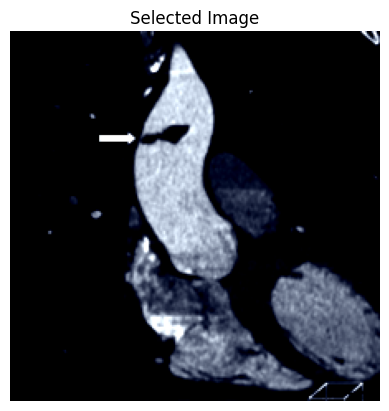


Generated caption:
 A computed tomography scan of the chest showing a large, non-tumor mass in the right atrium.


In [74]:
# === Load processor and tokenizer ===
processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
tokenizer = AutoTokenizer.from_pretrained("Salesforce/blip2-opt-2.7b")

# === Load BLIP2 8bit model with LoRA ===
quantization_config = BitsAndBytesConfig(load_in_8bit=True, llm_int8_threshold=200.0)

model = Blip2ForConditionalGeneration.from_pretrained(
    "Salesforce/blip2-opt-2.7b",
    device_map="auto",
    torch_dtype=torch.float16,
    quantization_config=quantization_config
)

lora_config = LoraConfig(
    r=4,
    lora_alpha=16,
    lora_dropout=0.05,
    bias="none",
    target_modules=["q_proj", "k_proj"]
)

model = get_peft_model(model, lora_config)
model = model.cuda()

# === Load trained LoRA weights ===
model.load_state_dict(torch.load("/content/drive/MyDrive/best_model/best_model.pth"))
model.eval()

# === Choose image input method ===
print("Select image input mode:")
print("1: Upload an image file from your computer")
print("2: Enter a local image path manually (e.g., /content/myimage.jpg)")
print("3: Choose an image from the test_dataset by index")

mode = int(input("Enter 1, 2, or 3 to choose a mode: "))
assert mode in [1, 2, 3], "Invalid mode selected."

if mode == 1:
    print("\n[Mode 1] Uploading an image...")
    uploaded = files.upload()
    image_path = list(uploaded.keys())[0]
    image = Image.open(image_path).convert("RGB")

elif mode == 2:
    print("\n[Mode 2] Loading image from manual path...")
    image_path = input("Enter the full path to the image: ")
    image = Image.open(image_path).convert("RGB")

elif mode == 3:
    print("\n[Mode 3] Selecting image from test_dataset...")
    idx = int(input(f"Enter an index between 0 and {len(test_dataset) - 1}: "))
    image_tensor = test_dataset[idx]["pixel_values"]
    ref_caption = test_dataset[idx]["text"]
    image = to_pil_image(torch.clamp((image_tensor + 1) / 2, 0, 1))
    print(f"\nReference caption:\n{ref_caption}")

# === Show the selected image ===
plt.imshow(image)
plt.axis("off")
plt.title("Selected Image")
plt.show()

# === Generate caption ===
inputs = processor(images=image, return_tensors="pt").to("cuda")

with torch.no_grad():
    generated_ids = model.generate(**inputs, max_new_tokens=100)
    caption = tokenizer.decode(generated_ids[0], skip_special_tokens=True)

print("\nGenerated caption:\n", caption)

## LoRA - Full Target

In [ ]:
config = LoraConfig(
    r=4,
    lora_alpha=16,
    lora_dropout=0.05,
    bias="none",
    target_modules=["q_proj", "k_proj", "v_proj", "out_proj"])  #Official

model = get_peft_model(model, config)
model.print_trainable_parameters()

trainable params: 2,621,440 || all params: 3,747,383,296 || trainable%: 0.0700
